# CS448 - Lab 2: Filter Design and Usage

For this lab you will learn how to design some simple filters and how to apply them to solve some common audio problems. Python’s scipy.signal package has an extensive set of commands to help you design filters (firwin, firwin2, butter, cheby1, cheby2,  ellip, …), so there is no shortage of options.

## Part 1: When to use what 

There will be four cases to this part, each requiring a different type of filter to address a problem in a recording.  The input recordings are:

- ```case1.wav``` [https://drive.google.com/uc?export=download&id=1eTsDiXqqLQv3murPz25O54E89i3DL__d ] : A noise-corrupted speech signal. We want to eliminate the noise.
- ```case2.wav``` [https://drive.google.com/uc?export=download&id=1egd22CxPUe6sINIi0FPTbMfG4S_In2hT ] : Same as above, different type of noise. We want to remove the noise again.
- ```case3.wav``` [https://drive.google.com/uc?export=download&id=1eF-VOVWoT1rh1wAC06WT1ANusMKyDYSn ] : Bird songs during a thunderstorm. As a world renowned ornithologist you need to have a cleaner recording of the bird songs for further analysis.
- ```case4.wav``` [https://drive.google.com/uc?export=download&id=1eeizGhrBICf6pW5OXcbq7ChF4m2N6yIk ]: The signal that we require to extract here is a Morse code which is buried in environmental noise. Design a filter to bring out the beeps.

For each case do the following:
- Plot the spectrogram of the given sound and identify the problem
- Describe what kind of filter will address this problem and why
- Design an FIR filter using ```scipy.signal.firwin()``` and/or ```scipy.signal.firwin2()```
- Design an FIR filter using the formulas in my slides (i.e. do not use ```scipy.signal```)
- Design an IIR Butterworth filter using ```scipy.signal```'s routines
- Show a plot comparing the response of all the filters (hint: ```scipy.signal.freqz```)
- Plot spectrograms of the filtered recordings and compare with the input to show that it fixed the problem
- Play the filtered sounds so that we can hear how well it works

Make some observations on how the results differ between an FIR and IIR filter and try to find the best possible filter size/type/parameters to produce the best result. Show results under various parameters (e.g. filter length) and make some plots that demonstrate the effects of these parameters. Most importantly, try to get a sense of how these design choices impact audible quality. Being able to listen at a sound and identify what’s wrong and how to fix it is a big part of audio processing.

Hint: To apply an FIR filter you can use ```scipy.signal.convolve```, to apply an IIR filter (or an FIR) you can use ```scipy,signal.lfilter```.

In [1]:
from scipy.io.wavfile import write, read
from scipy import signal
from scipy.fft import fftshift
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Make a sound player function that plays array "x" with a sample rate "rate", and labels it with "label"
def sound( x, rate=8000, label=''):
    from IPython.display import display, Audio, HTML
    display( HTML( 
    '<style> table, th, td {border: 0px; }</style> <table><tr><td>' + label + 
    '</td><td>' + Audio( x, rate=rate)._repr_html_()[3:] + '</td></tr></table>'
    ))

In [3]:
# Load a remote WAVE file given its URL, and return the sample rate and waveform
def wavreadurl( url):
    import urllib.request, io, scipy.io.wavfile
    f = urllib.request.urlopen( urllib.request.Request( url))
    sr,s = scipy.io.wavfile.read( io.BytesIO( f.read()))
    return sr, s.astype( 'float32')/32768

In [4]:
def plot_specgram(x, fs, title=''):
    plt.figure(figsize=(4, 3))
    plt.specgram(x, Fs=fs, cmap='Blues')
    plt.title(title)
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (sec)')
    plt.tight_layout()
    plt.show()

In [5]:
def plot_frequency_response(b, sr, title=''):
    w, h = signal.freqz(b)
    plt.figure(figsize=(4, 3))
    plt.plot(w / np.pi * (sr//2), 20 * np.log10(abs(h)+1e-3), 'b')
    plt.title(title)
    plt.ylabel('Amplitude (dB)')
    plt.xlabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()

case1


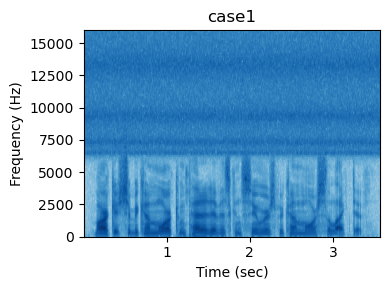

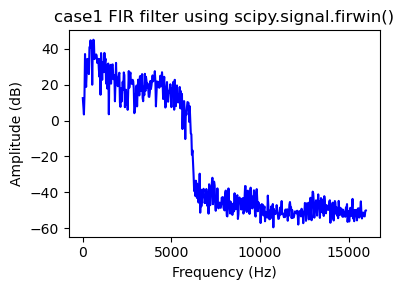

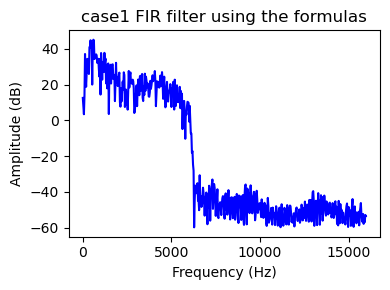

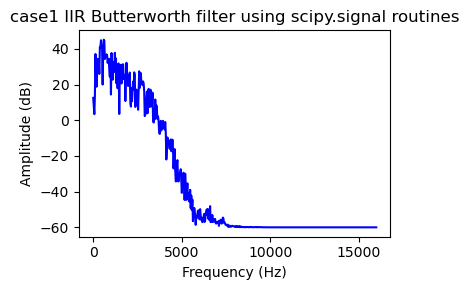

case1 FIR filter using scipy.signal.firwin()


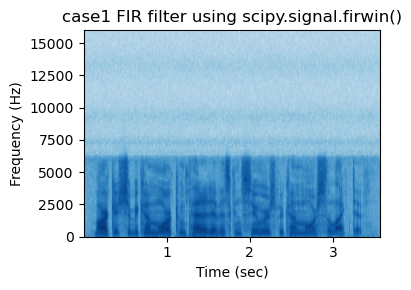

case1 FIR filter using the formulas


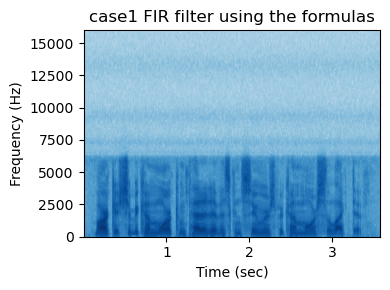

case1 IIR Butterworth filter using scipy.signal routines


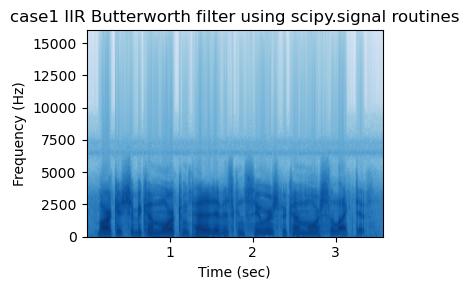

In [6]:
# Load the sound, play it, and plot it's spectrogram
# YOUR CODE HERE
url1 = 'https://drive.google.com/uc?export=download&id=1eTsDiXqqLQv3murPz25O54E89i3DL__d'
sr1, t1 = wavreadurl(url1)
sound(t1, sr1, 'case1')

dft_size = 512
hop_size = 128
window = signal.windows.hann(dft_size, sym=False)

plot_specgram(t1, sr1, 'case1')

# Design a filter that fixes things
# YOUR CODE HERE

# FIR filter using scipy.signal.firwin()
lowpass = signal.firwin(numtaps=201, cutoff=6000, pass_zero='lowpass', fs=sr1)
t1_1 = signal.convolve(t1, lowpass, mode='same')

# FIR filter using the formulas
n = np.arange(-100, 100+1)
w = 6000 / (sr1 / 2.0)
lowpass_formula = w * np.sinc(n * w) * np.hamming(len(n))
t1_2 = signal.convolve(t1, lowpass_formula)

# IIR Butterworth filter
b, a = signal.butter(10, 3000, 'lowpass', fs=sr1)
t1_3 = signal.lfilter(b, a, t1)

# Show a plot comparing the response of all the filters
plot_frequency_response(t1_1, sr1, title='case1 FIR filter using scipy.signal.firwin()')
plot_frequency_response(t1_2, sr1, title='case1 FIR filter using the formulas')
plot_frequency_response(t1_3, sr1, title='case1 IIR Butterworth filter using scipy.signal routines')

# Show me the resulting spectrogram and sound
# YOUR CODE HERE
sound(t1_1, sr1, 'case1 FIR filter using scipy.signal.firwin()')
plot_specgram(t1_1, sr1, 'case1 FIR filter using scipy.signal.firwin()')

sound(t1_2, sr1, 'case1 FIR filter using the formulas')
plot_specgram(t1_2, sr1, 'case1 FIR filter using the formulas')

sound(t1_3, sr1, 'case1 IIR Butterworth filter using scipy.signal routines')
plot_specgram(t1_3, sr1, 'case1 IIR Butterworth filter using scipy.signal routines')

case2


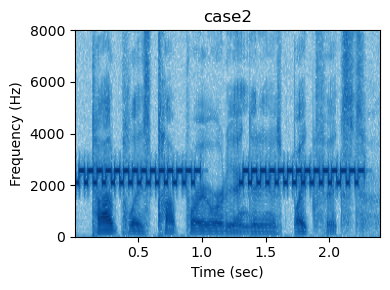

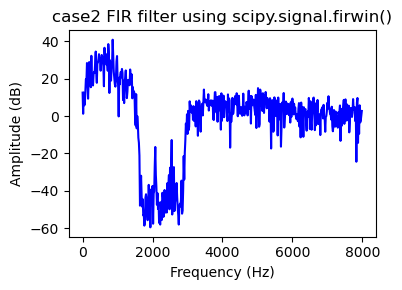

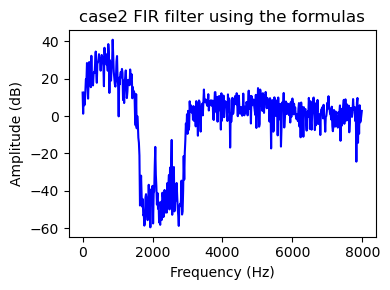

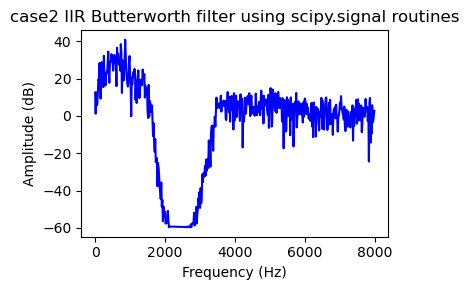

case2 FIR filter using scipy.signal.firwin()


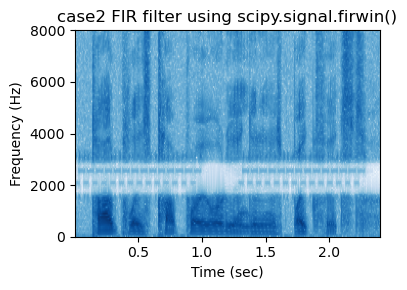

case2 FIR filter using the formulas


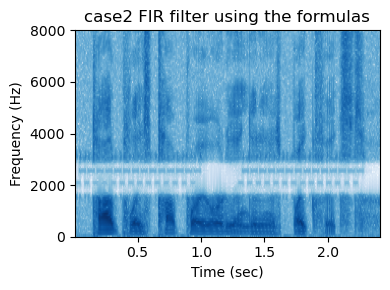

case2 IIR Butterworth filter using scipy.signal routines


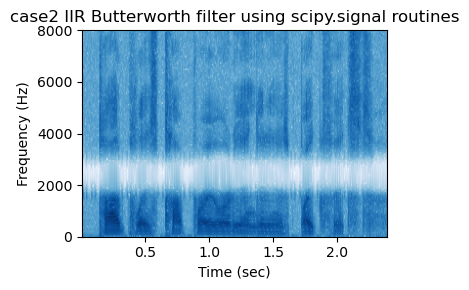

In [7]:
url2 = 'https://drive.google.com/uc?export=download&id=1egd22CxPUe6sINIi0FPTbMfG4S_In2hT'
sr2, t2 = wavreadurl(url2)
sound(t2, sr2, 'case2')

dft_size = 512
hop_size = 128
window = signal.windows.hann(dft_size, sym=False)

plot_specgram(t2, sr2, 'case2')

# Design a filter that fixes things
# YOUR CODE HERE

# FIR filter using scipy.signal.firwin()
lowpass = signal.firwin(numtaps=201, cutoff=[1500, 3000], pass_zero='bandstop', fs=sr2)
t2_1 = signal.convolve(t2, lowpass, mode='same')

# FIR filter using the formulas
n = np.arange(-100, 100+1)
wc = 2250 / (sr2 / 2.0)
wb = 750 / (sr2 / 2.0)
bandstop_formula = -2 * np.cos(np.pi * n * wc) * wb * np.sinc(wb * n)
bandstop_formula[100] = 1 - 2 * np.cos(np.pi * 0 * wc) * wb * np.sinc(wb * 0)
bandstop_formula = bandstop_formula * np.hamming(len(n))
t2_2 = signal.convolve(t2, bandstop_formula)

# IIR Butterworth filter
b, a = signal.butter(10, [1500, 3500], 'bandstop', fs=sr2)
t2_3 = signal.lfilter(b, a, t2)

# Show a plot comparing the response of all the filters
plot_frequency_response(t2_1, sr2, title='case2 FIR filter using scipy.signal.firwin()')
plot_frequency_response(t2_2, sr2, title='case2 FIR filter using the formulas')
plot_frequency_response(t2_3, sr2, title='case2 IIR Butterworth filter using scipy.signal routines')

# Show me the resulting spectrogram and sound
# YOUR CODE HERE
sound(t2_1, sr2, 'case2 FIR filter using scipy.signal.firwin()')
plot_specgram(t2_1, sr2, 'case2 FIR filter using scipy.signal.firwin()')

sound(t2_2, sr2, 'case2 FIR filter using the formulas')
plot_specgram(t2_2, sr2, 'case2 FIR filter using the formulas')

sound(t2_3, sr2, 'case2 IIR Butterworth filter using scipy.signal routines')
plot_specgram(t2_3, sr2, 'case2 IIR Butterworth filter using scipy.signal routines')

case3


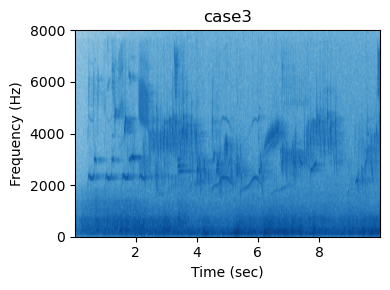

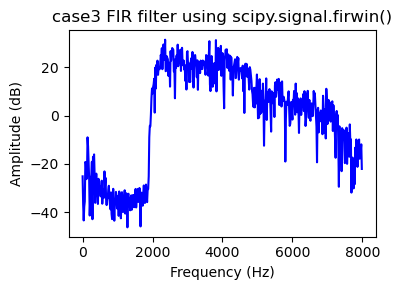

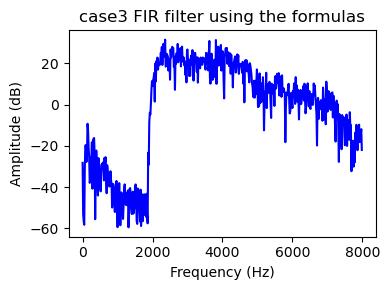

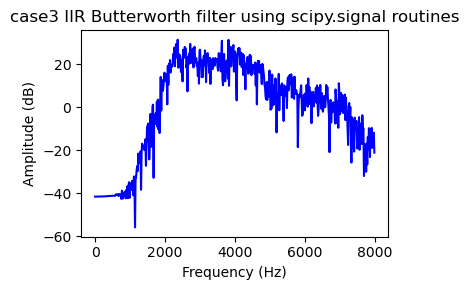

case3 FIR filter using scipy.signal.firwin()


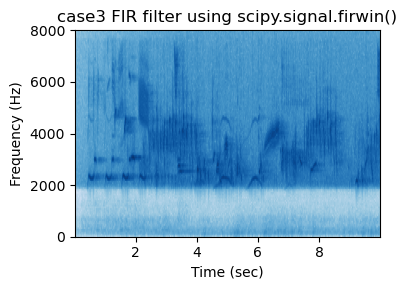

case3 FIR filter using the formulas


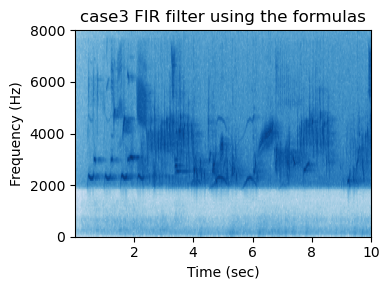

case3 IIR Butterworth filter using scipy.signal routines


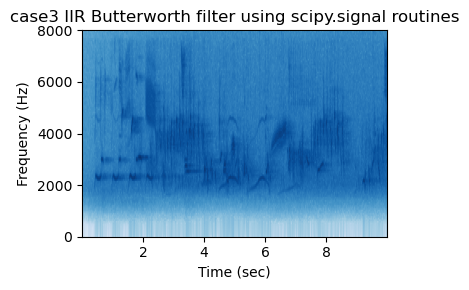

In [8]:
url3 = 'https://drive.google.com/uc?export=download&id=1eF-VOVWoT1rh1wAC06WT1ANusMKyDYSn'
sr3, t3 = wavreadurl(url3)
sound(t3, sr3, 'case3')

dft_size = 512
hop_size = 128
window = signal.windows.hann(dft_size, sym=False)

plot_specgram(t3, sr3, 'case3')

# Design a filter that fixes things
# YOUR CODE HERE

# FIR filter using scipy.signal.firwin()
highpass = signal.firwin(numtaps=201, cutoff=2000, pass_zero='highpass', fs=sr3)
t3_1 = signal.convolve(t3, highpass, mode='same')

# FIR filter using the formulas
n = np.arange(-100, 100+1)
w = 2000 / (sr3 / 2.0)
highpass_formula = -w * np.sinc(n * w)
highpass_formula[100] = 1 - w * np.sinc(0 * w)
highpass_formula = highpass_formula * np.hamming(len(n))
t3_2 = signal.convolve(t3, highpass_formula)

# IIR Butterworth filter
b, a = signal.butter(10, 2000, 'highpass', fs=sr3)
t3_3 = signal.lfilter(b, a, t3)

# Show a plot comparing the response of all the filters
plot_frequency_response(t3_1, sr3, title='case3 FIR filter using scipy.signal.firwin()')
plot_frequency_response(t3_2, sr3, title='case3 FIR filter using the formulas')
plot_frequency_response(t3_3, sr3, title='case3 IIR Butterworth filter using scipy.signal routines')

# Show me the resulting spectrogram and sound
# YOUR CODE HERE
sound(t3_1, sr3, 'case3 FIR filter using scipy.signal.firwin()')
plot_specgram(t3_1, sr3, 'case3 FIR filter using scipy.signal.firwin()')

sound(t3_2, sr3, 'case3 FIR filter using the formulas')
plot_specgram(t3_2, sr3, 'case3 FIR filter using the formulas')

sound(t3_3, sr3, 'case3 IIR Butterworth filter using scipy.signal routines')
plot_specgram(t3_3, sr3, 'case3 IIR Butterworth filter using scipy.signal routines')

case4


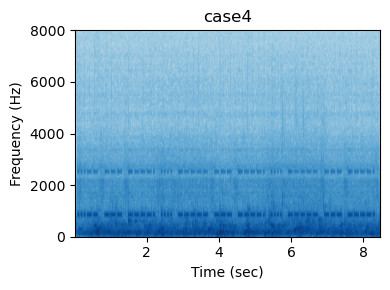

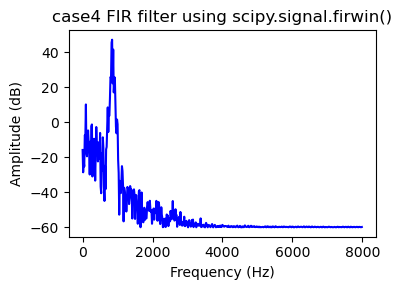

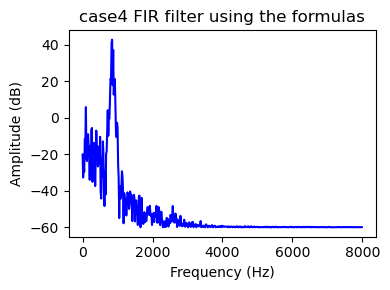

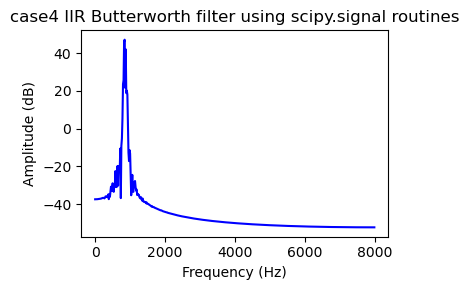

case4 FIR filter using scipy.signal.firwin()


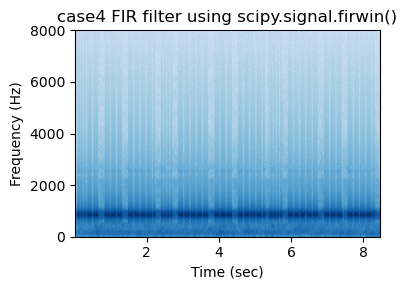

case4 FIR filter using the formulas


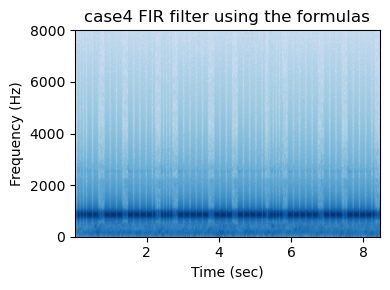

case4 IIR Butterworth filter using scipy.signal routines


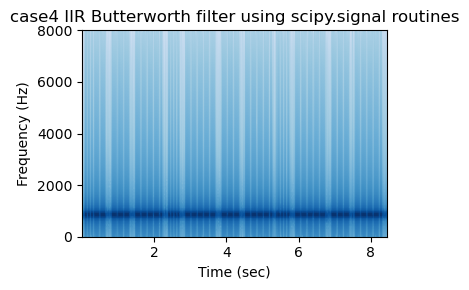

In [9]:
url4 = 'https://drive.google.com/uc?export=download&id=1eeizGhrBICf6pW5OXcbq7ChF4m2N6yIk'
sr4, t4 = wavreadurl(url4)
sound(t4, sr4, 'case4')

dft_size = 512
hop_size = 128
window = signal.windows.hann(dft_size, sym=False)

plot_specgram(t4, sr4, 'case4')

# Design a filter that fixes things
# YOUR CODE HERE

# FIR filter using scipy.signal.firwin()
bandpass = signal.firwin(numtaps=201, cutoff=[800, 900], pass_zero='bandpass', fs=sr4)
t4_1 = signal.convolve(t4, bandpass)

# FIR filter using the formulas
n = np.arange(-100, 100+1)
wc = 850 / (sr4 / 2.0)
wb = 50 / (sr4 / 2.0)
bandpass_formula = 2 * np.cos(np.pi * n * wc) * wb * np.sinc(wb * n)
bandpass_formula = bandpass_formula * np.hamming(len(n))
t4_2 = signal.convolve(t4, bandpass_formula)

# IIR Butterworth filter
b, a = signal.butter(4, [800, 900], 'bandpass', fs=sr4)
t4_3 = signal.lfilter(b, a, t4)

# Show a plot comparing the response of all the filters
plot_frequency_response(t4_1, sr4, title='case4 FIR filter using scipy.signal.firwin()')
plot_frequency_response(t4_2, sr4, title='case4 FIR filter using the formulas')
plot_frequency_response(t4_3, sr4, title='case4 IIR Butterworth filter using scipy.signal routines')

# Show me the resulting spectrogram and sound
# YOUR CODE HERE
sound(t4_1, sr4, 'case4 FIR filter using scipy.signal.firwin()')
plot_specgram(t4_1, sr4, 'case4 FIR filter using scipy.signal.firwin()')

sound(t4_2, sr4, 'case4 FIR filter using the formulas')
plot_specgram(t4_2, sr4, 'case4 FIR filter using the formulas')

sound(t4_3, sr4, 'case4 IIR Butterworth filter using scipy.signal routines')
plot_specgram(t4_3, sr4, 'case4 IIR Butterworth filter using scipy.signal routines')

## Part 2. Designing a simple equalizer

For this part we will design a simple graphic equalizer. We will do so using a more straightforward approach as opposed to a bank of filters as discussed in class.

We want to make an equalizer which contains six bands with center frequencies at 100Hz, 200Hz, 400Hz, 800Hz, 1600Hz and 3200Hz. Your equalizer function will take two inputs, one for the input sound and a 6-element gain vector that will indicate how much to boost or suppress each frequency band. Use the ```scipy.signal.firwin2``` function to design a filter that has the desired characteristics. For various settings of the gain vector, use the ```scipy.signal.freqz``` command to plot the response of the filter and verify that it behaves as indicated. Experiment with various filter lengths and see which works best.

Once you figure that out, design a graphic equalizer with as many bands as you like (and arbitrary center frequencies as well), and use it to solve the problems in part 1 again. The only thing that should be different in the EQ for each recording should be the gains for each band. Play the output sounds, and show the spectrograms, see how they compare with your previous solutions.

Optional extra credit (+1pt): Use ipywidgets to make interactive sliders and process an audio stream and play it from the speakers in real-time (either from mic input, or just stream audio from disk).

In [10]:
# Design an equalizer function
def equalizer( input_sound, gains, fs=8000, title=''):
    gains = [1.0] + gains + [1.0]
    eq = signal.firwin2(201, [0, 100, 200, 400, 800, 1600, 3200, fs/2], gains, nyq=fs/2)
    plot_frequency_response(eq, fs, title)
    return signal.convolve(input_sound, eq)

def my_equalizer( input_sound, numtaps, freq, gains, fs=8000, title=''):
    eq = signal.firwin2(numtaps, freq, gains, nyq=fs/2)
    plot_frequency_response(eq, fs, title)
    return signal.convolve(input_sound, eq)



/var/folders/0g/89mv96h154jc5lyjm68vcdyr0000gn/T/ipykernel_11223/1817853275.py:4: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  eq = signal.firwin2(201, [0, 100, 200, 400, 800, 1600, 3200, fs/2], gains, nyq=fs/2)


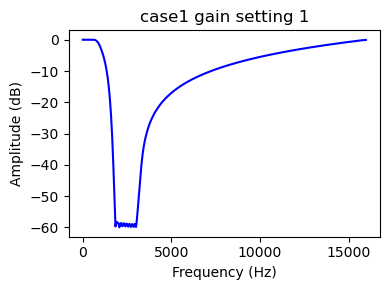

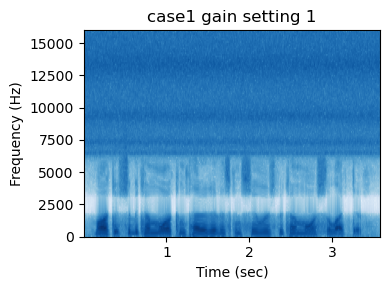

case1 gain setting 1


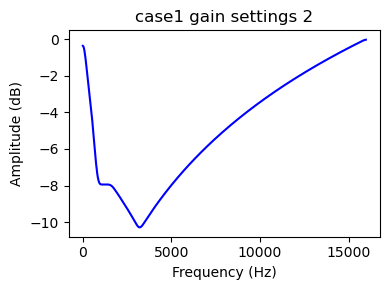

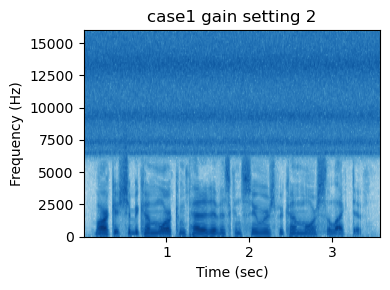

case1 gain settings 2


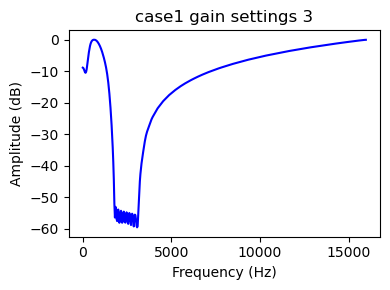

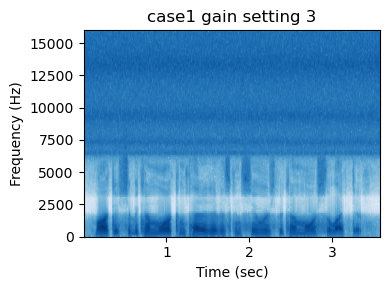

case1 gain settings 3


In [11]:
# Show its response with various gain settings
# YOUR CODE HERE
t1_eq1 = equalizer(t1, [1.0, 1.0, 1.0, 1.0, 0.0, 0.0], sr1, 'case1 gain setting 1')
plot_specgram(t1_eq1, sr1, 'case1 gain setting 1')
sound(t1_eq1, sr1, 'case1 gain setting 1')

t1_eq2 = equalizer(t1, [1.0, 0.8, 0.7, 0.4, 0.4, 0.3], sr1, 'case1 gain settings 2')
plot_specgram(t1_eq2, sr1, 'case1 gain setting 2')
sound(t1_eq2, sr1, 'case1 gain settings 2')

t1_eq3 = equalizer(t1, [0.0, 0.0, 1.0, 1.0, 0.0, 0.0], sr1, 'case1 gain settings 3')
plot_specgram(t1_eq3, sr1, 'case1 gain setting 3')
sound(t1_eq3, sr1, 'case1 gain settings 3')

/var/folders/0g/89mv96h154jc5lyjm68vcdyr0000gn/T/ipykernel_11223/1817853275.py:9: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  eq = signal.firwin2(numtaps, freq, gains, nyq=fs/2)


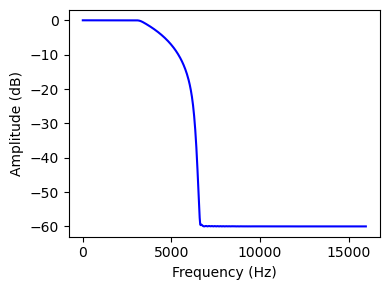

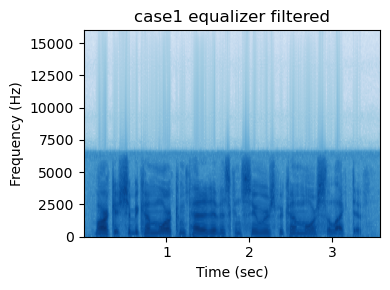

case1 equalizer filtered


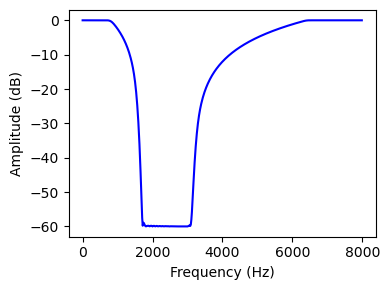

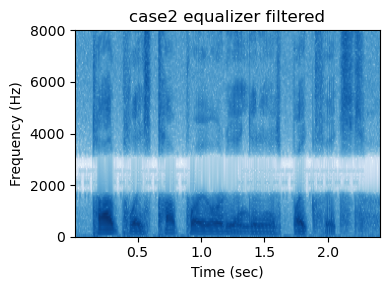

case2 equalizer filtered


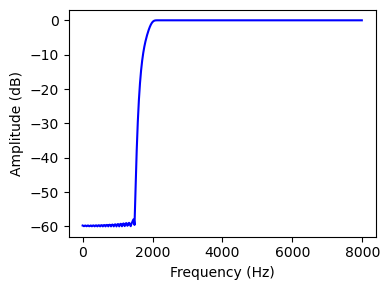

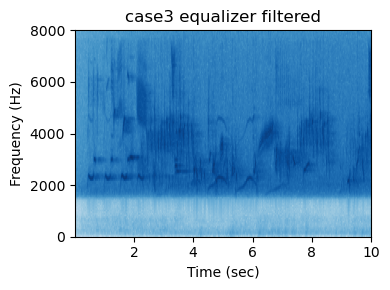

case3 equalizer filtered


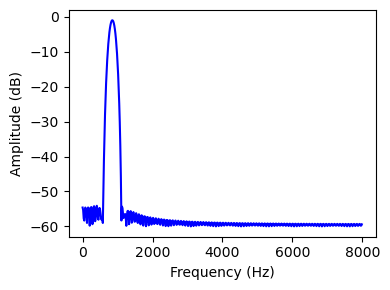

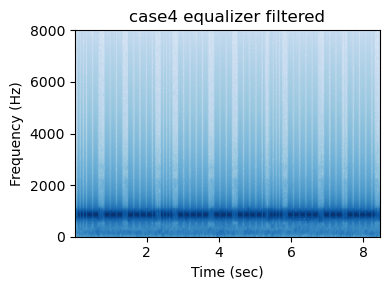

case4 equalizer filtered


In [12]:
# Show how it can denoise the examples in part 1
# YOUR CODE HERE
t1_eq = my_equalizer(t1, numtaps=201,
                      freq=[0, 100, 200, 400, 800, 1600, 3200, 6400, sr1/2], 
                      gains=[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0],
                      fs=sr1)
plot_specgram(t1_eq, sr1, 'case1 equalizer filtered')
sound(t1_eq, sr1, 'case1 equalizer filtered')

t2_eq = my_equalizer(t2, numtaps=201,
                      freq=[0, 100, 200, 400, 800, 1600, 3200, 6400, sr2/2], 
                      gains=[1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0],
                      fs=sr2)
plot_specgram(t2_eq, sr2, 'case2 equalizer filtered')
sound(t2_eq, sr2, 'case2 equalizer filtered')

t3_eq = my_equalizer(t3, numtaps=201,
                      freq=[0, 100, 200, 400, 800, 1600, 2000, 3200, 6400, sr3/2], 
                      gains=[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0],
                      fs=sr3)
plot_specgram(t3_eq, sr3, 'case3 equalizer filtered')
sound(t3_eq, sr3, 'case3 equalizer filtered')

t4_eq = my_equalizer(t4, numtaps=201,
                      freq=[0, 100, 200, 700, 800, 900, 1000, 3200, 6400, sr4/2], 
                      gains=[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0],
                      fs=sr4)
plot_specgram(t4_eq, sr4, 'case4 equalizer filtered')
sound(t4_eq, sr4, 'case4 equalizer filtered')

## Part 3: Say Ahhh ...

Let's make the computer talk.  To do so we need two things, an excitation signal and a filter.  For the excitation we will use something called the "Rosenberg Pulse".  A simple version of it will be the same as a cosine, but it will only be non-zero between phases $3\pi/2$ and $2\pi$.  It will effectively look like a curvy ramp from zero to one that takes place during the last quarter of each period.  Using it, generate a 0.3 sec signal with a frequency of 100Hz, at a sampling rate of 8kHz.  It should sound like a short buzzy tone.

In [13]:
# Your code here
duration = 0.3
frequency = 100
sampling_rate = 8000
total_samples = int(duration * sampling_rate)

t = np.linspace(0, duration, total_samples, endpoint=False)
x = np.zeros_like(t) 
period = 1 / frequency 
samples_per_period = int(period * sampling_rate)
quarter_period_samples = samples_per_period // 4

for i in range(0, total_samples, samples_per_period):
    if i + quarter_period_samples * 3 < total_samples:
        ramp_start = i + 3 * quarter_period_samples
        ramp_end = min(i + samples_per_period, total_samples)
        ramp_duration = ramp_end - ramp_start
        phase = np.linspace(0, np.pi / 2, ramp_duration, endpoint=False)
        x[ramp_start:ramp_end] = np.cos(phase - np.pi / 2)

sound(x, 8000, '100Hz')

100Hz


Now that you have a glottal pulse, let's apply some filters to generate two vowels, "a" and "u".  In the code snippet below I have two tables that hold the center frequency and amplitude of the five resonances that make each vowel.  To model these resonances, design a bandpass filter with a bandwidth of 90Hz centered at each of the given frequencies.  You will end up with five filters for each vowel.  Then take the pulse sound from above and convolve it with the five filters of each vowel (in parallel, not in series) and add the outputs together and scale them with their corresponding amplitudes in the given tables.  Play the results and verify that they sound like an "a" and an "u".

To design the filters, use the ```scipy.signal.firwin``` function with filters of length 61.

In [14]:
# Formant table for "a"
Fa = [
    [600, 1040, 2250, 2450, 2750], # Formant frequencies in Hz
    [1,     .7,   .6,   .5,   .3], # Formant amplitudes
]

# Formant table for "u"
Fu = [
    [400, 600, 2400, 2675, 2950], # Formant frequencies in Hz
    [1,    .7,   .6,   .5,   .3], # Formant amplitudes
]

# Your code here
def generate_vowel(x, formant_freqs, formant_amps, sampling_rate):
    vowel_sound = np.zeros_like(x)
    filter_length = 61
    for center_freq, amp in zip(formant_freqs, formant_amps):
        bandwidth = 90
        low = (center_freq - bandwidth / 2) / (sampling_rate / 2)
        high = (center_freq + bandwidth / 2) / (sampling_rate / 2)
        bp_filter = signal.firwin(filter_length, [low, high], pass_zero=False)
        filtered_signal = signal.lfilter(bp_filter, 1.0, x)
        vowel_sound += filtered_signal * amp
    return vowel_sound

vowel_a = generate_vowel(x, Fa[0], Fa[1], 8000)
vowel_u = generate_vowel(x, Fu[0], Fu[1], 8000)

vowel_a /= np.max(np.abs(vowel_a))
vowel_u /= np.max(np.abs(vowel_u))

sound(vowel_a, 8000, 'A')
sound(vowel_u, 8000, 'U')

A


U


Now let's try to compose a word by combining the vowels.  Concatenate the two sounds above and play the result to form the word "ow".  It will not sound great because the transition from one to the other is too abrupt.  To make this a little better, we will need to crossfade the two sounds (just as you have already done for lab 0, part 3).  To do so, use a 100ms linear crossfade between the two sounds.  Play the result and verify that it sounds better.

In [16]:
# Your code here
crossfade_samples = int(0.1 * 8000)
crossfade_window = np.linspace(0, 1, crossfade_samples)

vowel_a_fade = vowel_a[-crossfade_samples:] * (1 - crossfade_window)
vowel_u_fade = vowel_u[:crossfade_samples] * crossfade_window

crossfaded_part = vowel_a_fade + vowel_u_fade

ow_sound = np.concatenate((vowel_a[:-crossfade_samples], crossfaded_part, vowel_u[crossfade_samples:]))
ow_sound /= np.max(np.abs(ow_sound))

sound(np.concatenate((vowel_a, vowel_u)), 8000, 'Without Crossfade')
sound(ow_sound, 8000, 'With Crossfade')

Without Crossfade


With Crossfade


Congrats, you just made your computer talk!  For an early example of this type of speech generation, check out the "Daisy, Daisy" song as rendered by a computer in 1961.  [https://www.youtube.com/watch?v=41U78QP8nBk](https://www.youtube.com/watch?v=41U78QP8nBk)  This was the first instance of a computer singing, and a precursor to models like Vocaloid (which are of course a lot better!).  If you are into sci-fi, you might also remember HAL 9000 singing this song in 2001: A Space Odyssey.  It was a nod to this early achievement in computer speech synthesis.
